In [ ]:
64750, 65477 

In [6]:
import torch
import torch.nn as nn
import torch.optim as optim
import torchvision
import torchvision.transforms as transforms

# Define a transform to normalize the data
transform = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize((0.5, 0.5, 0.5), (0.5, 0.5, 0.5))
])

# Load CIFAR-10 dataset
trainset = torchvision.datasets.CIFAR10(root='./data', train=True, download=True, transform=transform)
trainloader = torch.utils.data.DataLoader(trainset, batch_size=128, shuffle=True, num_workers=2)

testset = torchvision.datasets.CIFAR10(root='./data', train=False, download=True, transform=transform)
testloader = torch.utils.data.DataLoader(testset, batch_size=128, shuffle=False, num_workers=2)

# Define the model
class LappedTransformCNN(nn.Module):
    def __init__(self):
        super(LappedTransformCNN, self).__init__()
        # Define the convolutional layer for the transform
        # These kernels act as the transform filters
        self.conv1 = nn.Conv2d(in_channels=3, out_channels=24, kernel_size=8, stride=8, padding=0, bias=False)
        # Define the inverse convolutional layer for reconstruction
        # These kernels act as the inverse transform filters
        self.conv2 = nn.ConvTranspose2d(in_channels=24, out_channels=3, kernel_size=8, stride=8, padding=0, bias=False)

    def forward(self, x):
        x = self.conv1(x)  # Apply the transform filters
        x = self.conv2(x)  # Apply the inverse transform filters to reconstruct the image
        return x

model = LappedTransformCNN()

# Define the loss function and optimizer
criterion = nn.MSELoss()
optimizer = optim.Adam(model.parameters(), lr=0.001)

# Train the model
num_epochs = 10

for epoch in range(num_epochs):
    running_loss = 0.0
    for i, data in enumerate(trainloader, 0):
        inputs, _ = data  # inputs are the original images, targets are also the original images

        optimizer.zero_grad()

        outputs = model(inputs)  # Model's attempt to reconstruct the inputs
        loss = criterion(outputs, inputs)  # Loss is computed between outputs and inputs
        loss.backward()
        optimizer.step()

        running_loss += loss.item()
        if i % 100 == 99:    # print every 100 mini-batches
            print(f"[{epoch + 1}, {i + 1}] loss: {running_loss / 100:.3f}")
            running_loss = 0.0

print('Finished Training')

# Evaluate the model
model.eval()
total_loss = 0.0
with torch.no_grad():
    for data in testloader:
        inputs, _ = data  # inputs are the original images, targets are also the original images
        outputs = model(inputs)
        loss = criterion(outputs, inputs)  # Loss is computed between outputs and inputs
        total_loss += loss.item()

print(f'Average test loss: {total_loss / len(testloader):.3f}')

# Save the model
torch.save(model.state_dict(), 'lapped_transform_cnn.pth')


Files already downloaded and verified
Files already downloaded and verified
[1, 100] loss: 0.097
[1, 200] loss: 0.038
[1, 300] loss: 0.026
[2, 100] loss: 0.016
[2, 200] loss: 0.014
[2, 300] loss: 0.012
[3, 100] loss: 0.010
[3, 200] loss: 0.010
[3, 300] loss: 0.009
[4, 100] loss: 0.009
[4, 200] loss: 0.009
[4, 300] loss: 0.009
[5, 100] loss: 0.009
[5, 200] loss: 0.009
[5, 300] loss: 0.009
[6, 100] loss: 0.008
[6, 200] loss: 0.008
[6, 300] loss: 0.009
[7, 100] loss: 0.008
[7, 200] loss: 0.008
[7, 300] loss: 0.008
[8, 100] loss: 0.008
[8, 200] loss: 0.008
[8, 300] loss: 0.008
[9, 100] loss: 0.009
[9, 200] loss: 0.008
[9, 300] loss: 0.008
[10, 100] loss: 0.009
[10, 200] loss: 0.008
[10, 300] loss: 0.008
Finished Training
Average test loss: 0.008


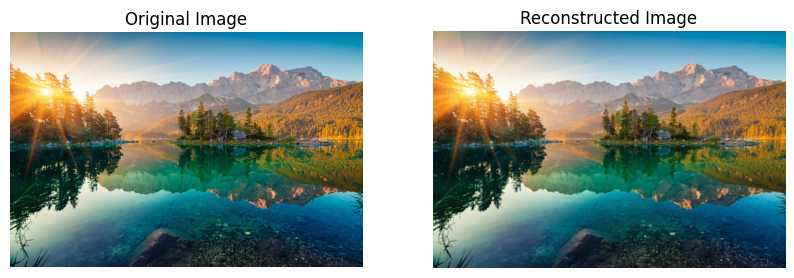

Original image size: 2332800 bytes
Compressed image size: 289440 bytes
Compression ratio: 8.059701492537313


In [7]:
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt

denormalize = transforms.Normalize((-1.0, -1.0, -1.0), (2.0, 2.0, 2.0))

def denormalize_image(tensor):
    return denormalize(tensor)

# Quantize function
def quantize(tensor, num_levels):
    min_val = tensor.min()
    max_val = tensor.max()
    scale = (max_val - min_val) / (num_levels - 1)
    quantized = torch.round((tensor - min_val) / scale)
    return quantized, scale, min_val

# Dequantize function
def dequantize(quantized, scale, min_val):
    dequantized = quantized * scale + min_val
    return dequantized

# Full Compression Function
def compress_image(image, model, num_levels):
    # Transform the image
    with torch.no_grad():
        transformed_image = model.conv1(image)
        #transformed_image = model.pool(transformed_image)
        #transformed_image = model.conv2(transformed_image)
    # Quantize the transformed image
    quantized_image, scale, min_val = quantize(transformed_image, num_levels)
    # Flatten and convert to byte stream
    flat_quantized = quantized_image.flatten().cpu().numpy()
    byte_stream = flat_quantized.tobytes()
    return byte_stream, quantized_image.shape, scale, min_val

# Full Decompression Function
def decompress_image(byte_stream, shape, scale, min_val, model):
    # Convert byte stream back to numpy array
    flat_quantized = np.frombuffer(byte_stream, dtype=np.float32)
    quantized_image = torch.tensor(flat_quantized).view(shape).to(model.conv1.weight.device)
    # Dequantize (inverse of quantization)
    dequantized_image = dequantize(quantized_image, scale, min_val)
    # Inverse transform
    with torch.no_grad():
        dequantized_image = model.conv2(dequantized_image)
        #dequantized_image = model.unpool(dequantized_image)
        #reconstructed_image = model.conv4(dequantized_image)
    return dequantized_image

# Load an external image using PIL
image = Image.open('/content/360_F_270350073_WO6yQAdptEnAhYKM5GuA9035wbRnVJSr.jpg')

# Convert the PIL image to a PyTorch tensor
example_image = transforms.ToTensor()(image).unsqueeze(0)
example_image = (example_image - 0.5) / 0.5  # Normalize the image

# Compress and decompress the example image
compressed_byte_stream, shape, scale, min_val = compress_image(example_image, model, num_levels=256)
reconstructed_image = decompress_image(compressed_byte_stream, shape, scale, min_val, model=model)

# Denormalize images
original_image_np = denormalize_image(example_image).squeeze().permute(1, 2, 0).cpu().numpy()
reconstructed_image_np = denormalize_image(reconstructed_image).squeeze().permute(1, 2, 0).cpu().numpy()



original_image_np = np.clip(original_image_np, 0, 1)
reconstructed_image_np = np.clip(reconstructed_image_np, 0, 1)

# Convert NumPy arrays back to PIL images
original_image_pil = Image.fromarray((original_image_np * 255).astype(np.uint8))
reconstructed_image_pil = Image.fromarray((reconstructed_image_np * 255).astype(np.uint8))

original_image_pil.save('original_image.png')
reconstructed_image_pil.save('reconstructed_image.png')

# Plot the original and reconstructed images
plt.figure(figsize=(10, 5))
plt.subplot(1, 2, 1)
plt.title('Original Image')
plt.imshow(original_image_np)
plt.axis('off')

plt.subplot(1, 2, 2)
plt.title('Reconstructed Image')
plt.imshow(reconstructed_image_np)
plt.axis('off')

plt.show()

# Check the sizes
original_image_size = example_image.nelement() * example_image.element_size()
compressed_image_size = len(compressed_byte_stream)
compression_ratio = original_image_size / compressed_image_size

print(f'Original image size: {original_image_size} bytes')
print(f'Compressed image size: {compressed_image_size} bytes')
print(f'Compression ratio: {compression_ratio}')

In [10]:
!pip install torch torchvision numpy

In [11]:
!git clone https://github.com/richzhang/PerceptualSimilarity.git
%cd PerceptualSimilarity
!pip install -r requirements.txt

Cloning into 'PerceptualSimilarity'...
remote: Enumerating objects: 800, done.
remote: Counting objects: 100% (797/797), done.
remote: Compressing objects: 100% (333/333), done.
remote: Total 800 (delta 470), reused 783 (delta 461), pack-reused 3
Receiving objects: 100% (800/800), 8.76 MiB | 9.54 MiB/s, done.
Resolving deltas: 100% (470/470), done.
/content/PerceptualSimilarity/PerceptualSimilarity


In [18]:
!pip install lpips

import torch
from torchvision import transforms
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
from lpips import LPIPS # Import the LPIPS class
from torch.nn import functional as F # Import for resizing

# Initialize LPIPS
lpips = LPIPS(net='alex').cuda() # You can choose a different net if needed, like 'vgg' or 'squeeze'

def calculate_lpips_loss(image1, image2):
    image1 = image1.unsqueeze(0).cuda()  # Add batch dimension and move to GPU
    image2 = image2.unsqueeze(0).cuda()  # Add batch dimension and move to GPU
    return lpips(image1, image2).item()

# Convert tensors to the range [-1, 1]
def convert_tensor_for_lpips(tensor):
    return tensor * 2 - 1  # Convert from [0, 1] to [-1, 1]

# Convert images to tensors
def image_to_tensor(image_np):
    return torch.tensor(image_np, dtype=torch.float32).permute(2, 0, 1) / 255.0

# Example usage with your previously defined tensors
original_image_tensor = image_to_tensor(original_image_np)
reconstructed_image_tensor = image_to_tensor(reconstructed_image_np)

# Resize the reconstructed image to match the original image
reconstructed_image_tensor_resized = F.interpolate(reconstructed_image_tensor.unsqueeze(0),
                                                  size=original_image_tensor.shape[1:], # Match dimensions of original image
                                                  mode='bilinear', align_corners=False).squeeze(0)

# Calculate LPIPS similarity
lpips_value = calculate_lpips_loss(
    convert_tensor_for_lpips(original_image_tensor),
    convert_tensor_for_lpips(reconstructed_image_tensor_resized) # Use the resized image
)

print(f'LPIPS Loss: {lpips_value}')


Setting up [LPIPS] perceptual loss: trunk [alex], v[0.1], spatial [off]


/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=AlexNet_Weights.IMAGENET1K_V1`. You can also use `weights=AlexNet_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Loading model from: /content/PerceptualSimilarity/PerceptualSimilarity/lpips/weights/v0.1/alex.pth
LPIPS Loss: 1.3674051842826884e-05


In [39]:
%cd /content/

/content


In [40]:
!git clone https://github.com/Karanraj06/image-compression

Cloning into 'image-compression'...
remote: Enumerating objects: 68, done.
remote: Counting objects: 100% (68/68), done.
remote: Compressing objects: 100% (63/63), done.
remote: Total 68 (delta 11), reused 56 (delta 4), pack-reused 0
Receiving objects: 100% (68/68), 17.34 MiB | 17.61 MiB/s, done.
Resolving deltas: 100% (11/11), done.


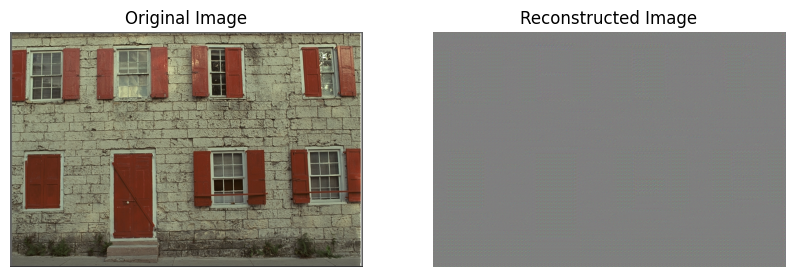

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


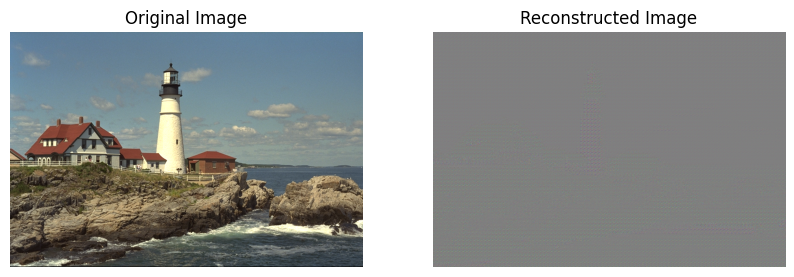

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


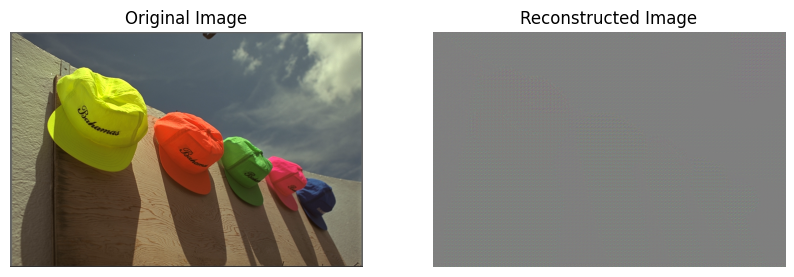

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


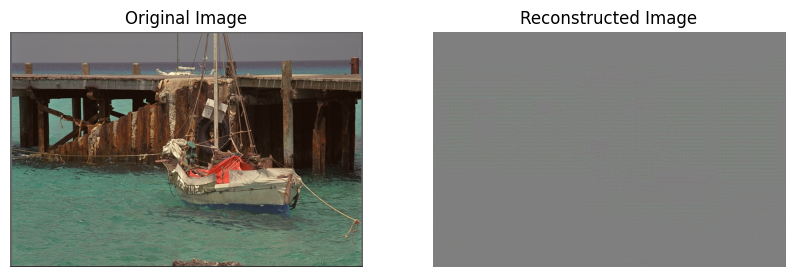

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


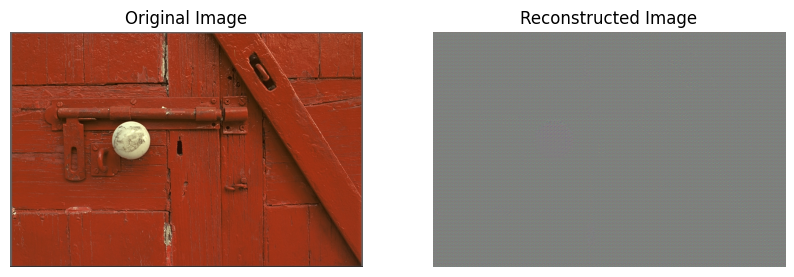

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


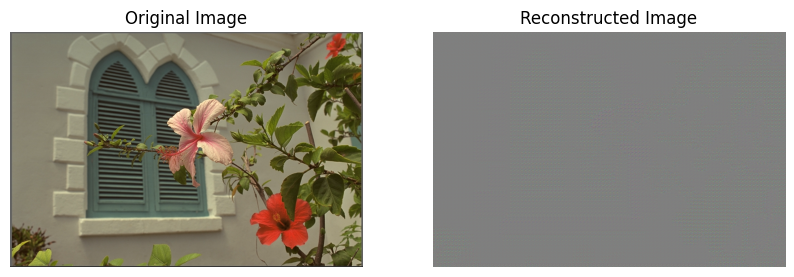

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


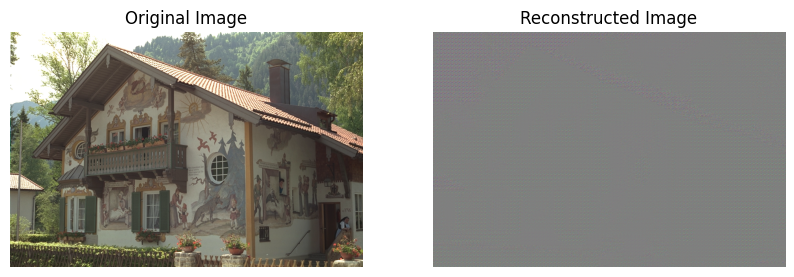

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


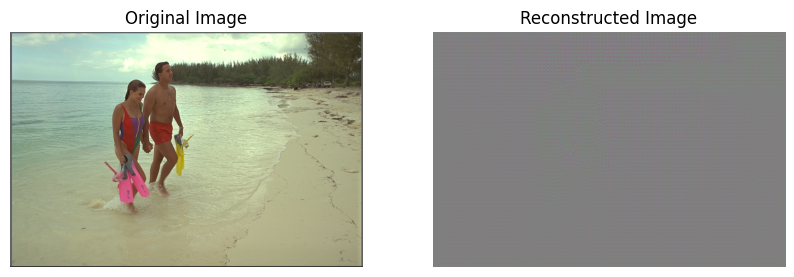

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


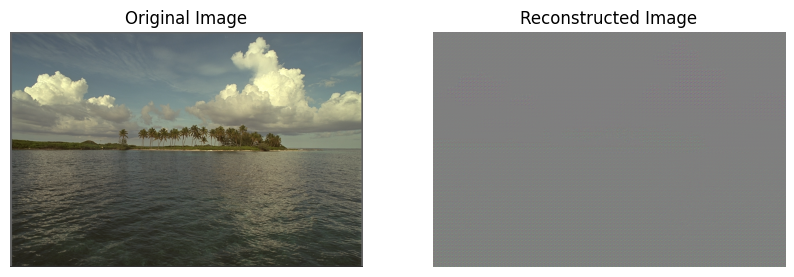

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


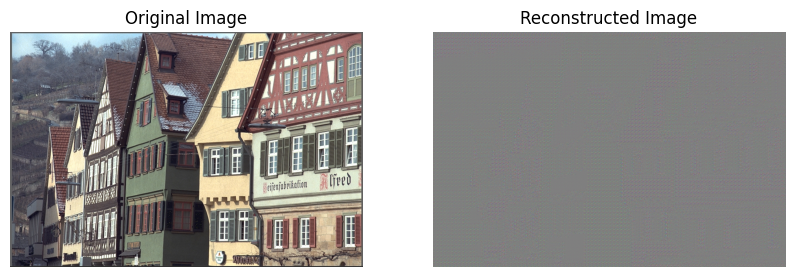

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


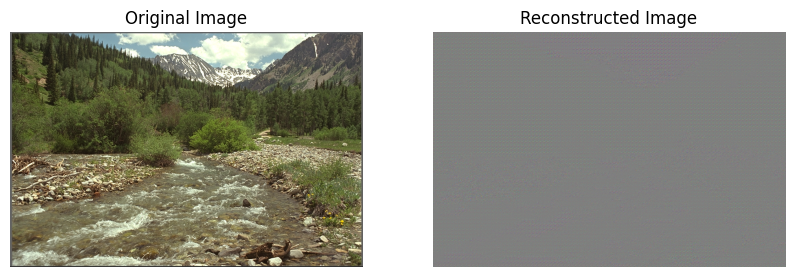

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


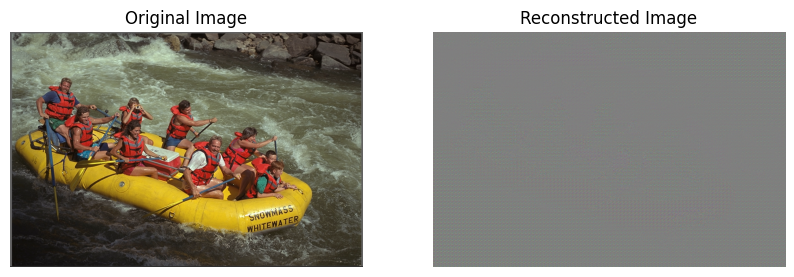

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


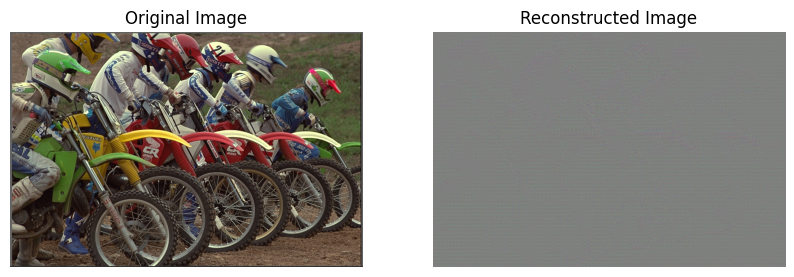

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


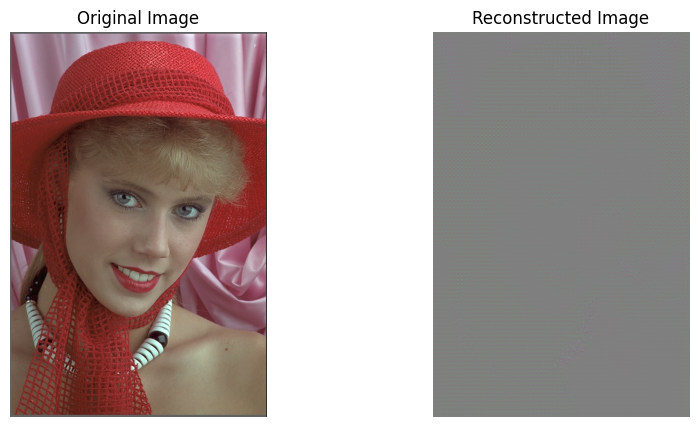

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


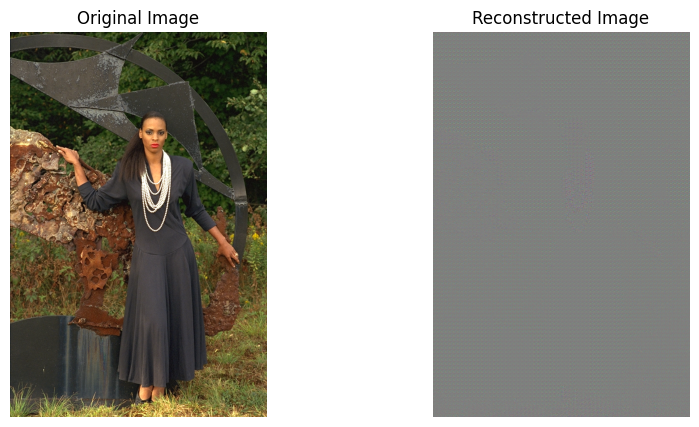

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


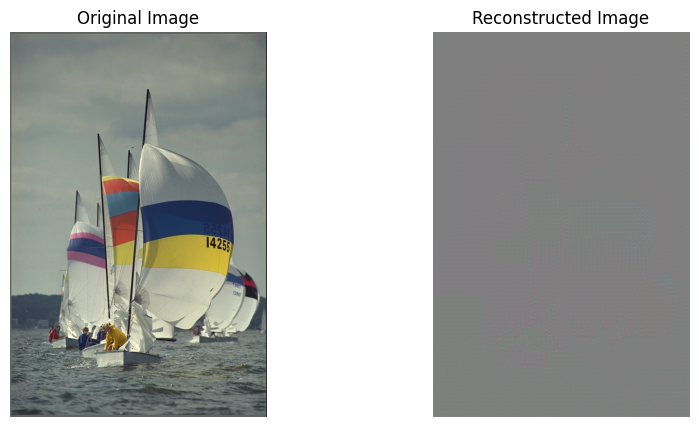

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


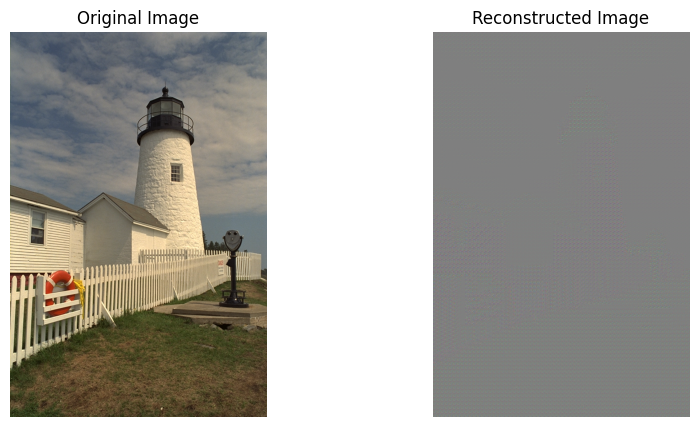

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


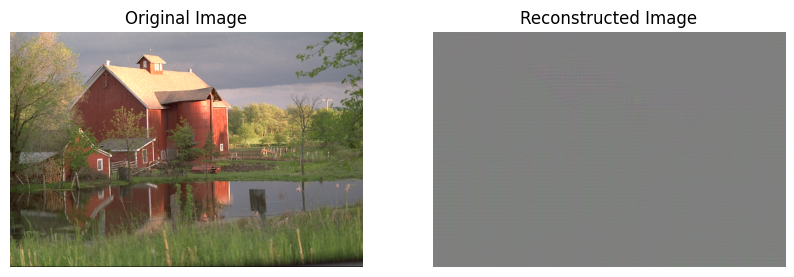

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


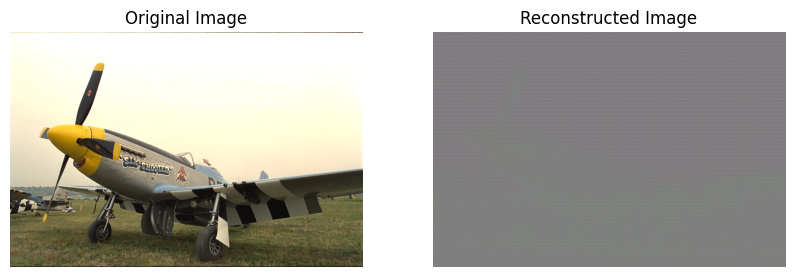

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


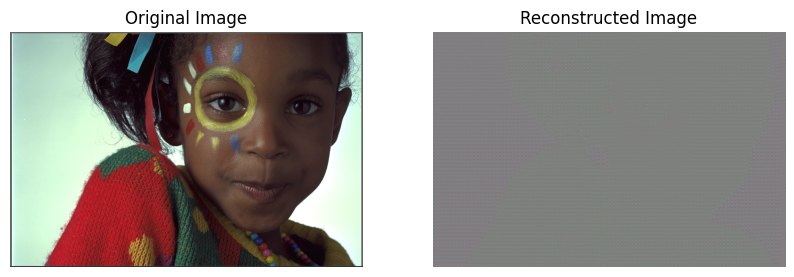

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


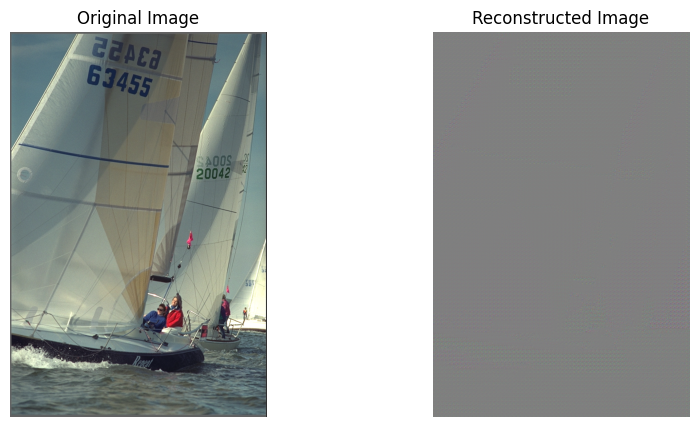

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


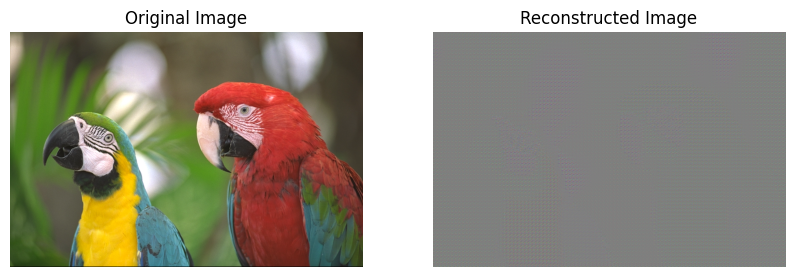

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


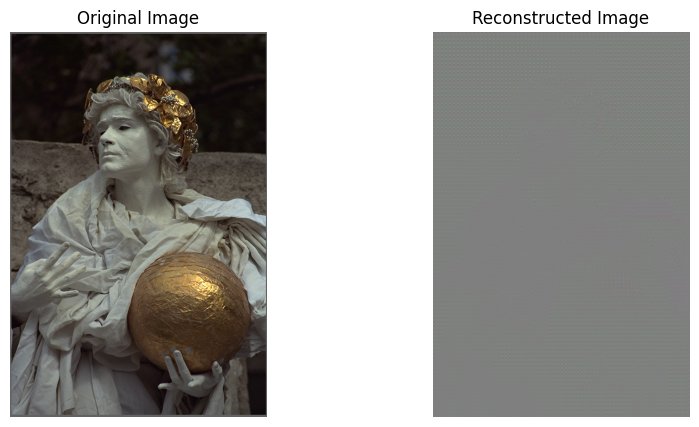

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


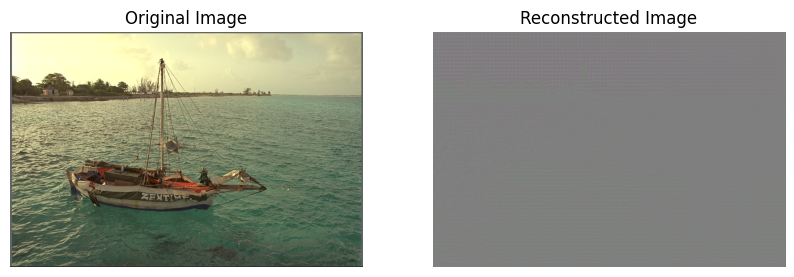

Original image size: 4718592 bytes
Compressed image size: 589824 bytes
Compression ratio: 8.0


In [3]:
import os
from PIL import Image
import numpy as np
import matplotlib.pyplot as plt
import torch
import torchvision.transforms as transforms

denormalize = transforms.Normalize((-1.0, -1.0, -1.0), (2.0, 2.0, 2.0))

def denormalize_image(tensor):
    return denormalize(tensor)

# Quantize function
def quantize(tensor, num_levels):
    min_val = tensor.min()
    max_val = tensor.max()
    scale = (max_val - min_val) / (num_levels - 1)
    quantized = torch.round((tensor - min_val) / scale)
    return quantized, scale, min_val

# Dequantize function
def dequantize(quantized, scale, min_val):
    dequantized = quantized * scale + min_val
    return dequantized

# Full Compression Function
def compress_image(image, model, num_levels):
    # Transform the image
    with torch.no_grad():
        transformed_image = model.conv1(image)
    # Quantize the transformed image
    quantized_image, scale, min_val = quantize(transformed_image, num_levels)
    # Flatten and convert to byte stream
    flat_quantized = quantized_image.flatten().cpu().numpy()
    byte_stream = flat_quantized.tobytes()
    return byte_stream, quantized_image.shape, scale, min_val

# Full Decompression Function
def decompress_image(byte_stream, shape, scale, min_val, model):
    # Convert byte stream back to numpy array
    flat_quantized = np.frombuffer(byte_stream, dtype=np.float32)
    quantized_image = torch.tensor(flat_quantized).view(shape).to(model.conv1.weight.device)
    # Dequantize (inverse of quantization)
    dequantized_image = dequantize(quantized_image, scale, min_val)
    # Inverse transform
    with torch.no_grad():
        dequantized_image = model.conv2(dequantized_image)
    return dequantized_image

# Path to the directory containing images
image_dir = '/content/image-compression/images/colored'  # Change this to the path of your image directory

# List all images in the directory
image_files = [f for f in os.listdir(image_dir) if os.path.isfile(os.path.join(image_dir, f))]

# Loop through each image in the directory
for image_file in image_files:
    image_path = os.path.join(image_dir, image_file)

    # Load the image
    image = Image.open(image_path)

    # Convert the PIL image to a PyTorch tensor
    example_image = transforms.ToTensor()(image).unsqueeze(0)
    example_image = (example_image - 0.5) / 0.5  # Normalize the image

    # Compress and decompress the example image
    compressed_byte_stream, shape, scale, min_val = compress_image(example_image, model, num_levels=256)
    reconstructed_image = decompress_image(compressed_byte_stream, shape, scale, min_val, model=model)

    # Denormalize images
    original_image_np = denormalize_image(example_image).squeeze().permute(1, 2, 0).cpu().numpy()
    reconstructed_image_np = denormalize_image(reconstructed_image).squeeze().permute(1, 2, 0).cpu().numpy()

    original_image_np = np.clip(original_image_np, 0, 1)
    reconstructed_image_np = np.clip(reconstructed_image_np, 0, 1)

    # Convert NumPy arrays back to PIL images
    original_image_pil = Image.fromarray((original_image_np * 255).astype(np.uint8))
    reconstructed_image_pil = Image.fromarray((reconstructed_image_np * 255).astype(np.uint8))

    original_image_pil.save(f'original_{image_file}')
    reconstructed_image_pil.save(f'reconstructed_{image_file}')

    # Plot the original and reconstructed images
    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.title('Original Image')
    plt.imshow(original_image_np)
    plt.axis('off')

    plt.subplot(1, 2, 2)
    plt.title('Reconstructed Image')
    plt.imshow(reconstructed_image_np)
    plt.axis('off')

    plt.show()

    # Check the sizes
    original_image_size = example_image.nelement() * example_image.element_size()
    compressed_image_size = len(compressed_byte_stream)
    compression_ratio = original_image_size / compressed_image_size

    print(f'Original image size: {original_image_size} bytes')
    print(f'Compressed image size: {compressed_image_size} bytes')
    print(f'Compression ratio: {compression_ratio}')
